# Tutorial 4: MERFISH: Mouse Brain

 <div style="margin:0; line-height:1.2">

 Analyze mouse brain spatial transcriptomics data with SpacGPA.<br/>



 Data source: https://alleninstitute.github.io/abc_atlas_access/descriptions/Zhuang-ABCA-1.html  <br/>



 This is a mouse brain sample generated with MERFISH.<br/>

 <div>

In [1]:
# Import SpacGPA and other required packages.
import SpacGPA as sg
import scanpy as sc
import matplotlib.pyplot as plt
import pandas as pd
import os


In [2]:
# Set the working directory to your local path.
workdir = '..'
os.chdir(workdir)


### Part 1: Gene program analysis via SpacGPA ###

In [3]:
# Load spatial transcriptomics data.
# Read the count matrix from the provided HDF5 file.
adata_all = sc.read_h5ad('/dta/ypxu/ST_GGM/Raw_Datasets/MERFISH/Zhuang-ABCA-1/Zhuang-ABCA-1-log2.h5ad')


In [4]:
# Read the cell metadata (including spatial coordinates) from the provided CSV file.
meta = pd.read_csv('/dta/ypxu/ST_GGM/Raw_Datasets/MERFISH/Zhuang-ABCA-1/cell_metadata.csv',header=0,index_col=0)
meta = meta.drop(columns=['brain_section_label'])
adata_all = adata_all[meta.index,:]
adata_all.obs = adata_all.obs.join(meta, how='left')
# Set the spatial coordinates.
adata_all.obsm['spatial']=meta[['x','y']].values
print(adata_all)


AnnData object with n_obs × n_vars = 2846908 × 1122
    obs: 'brain_section_label', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'cluster_alias', 'x', 'y', 'z', 'subclass_confidence_score', 'cluster_confidence_score', 'high_quality_transfer'
    var: 'gene_symbol'
    uns: 'normalization'
    obsm: 'spatial'


In [5]:
# Show each brain section label counts.
adata_all.obs['brain_section_label'].value_counts()


brain_section_label
Zhuang-ABCA-1.080    37068
Zhuang-ABCA-1.078    34735
Zhuang-ABCA-1.090    32633
Zhuang-ABCA-1.088    32314
Zhuang-ABCA-1.085    32047
                     ...  
Zhuang-ABCA-1.019     8029
Zhuang-ABCA-1.011     7644
Zhuang-ABCA-1.027     7211
Zhuang-ABCA-1.001     5893
Zhuang-ABCA-1.002     5505
Name: count, Length: 147, dtype: int64

In [6]:
adata = adata_all[adata_all.obs['brain_section_label']=='Zhuang-ABCA-1.080']
print(adata.X.shape) 


(37068, 1122)


In [7]:
# Construct the co-expression network using SpacGPA (Gaussian graphical model).
# Here we show a CPU-based calculation mode. For faster computation, you can also use GPU mode if a compatible GPU is available.
ggm = sg.create_ggm(adata, project_name = "Mouse Brain",run_mode= 0)
# For run_mode parameter: 0 for CPU mode; 1 for hybrid CPU-GPU mode; 2 for GPU mode.


Please Normalize The Expression Matrix Before Running!
Loading Data.
Converting np.ndarray to csr_matrix...

Running all calculations on CPU.
Using single precision (float32) for all calculations.
Using chunk size of 5000 for efficient computation

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 504 iterations.
Number of genes randomly selected in each iteration: 500
Iteration: 504/504, Avg loop time: 0.0118 s, Elapsed time: 0.10 min, Estimated time left: 0.00 min.                  
All iterations completed.

Performing FDR control...
Randomly redistribute the expression distribution of input genes...

Calculate correlation between genes after redistribution...

Computing the number of cells co-expressing each gene pair...
Computing covariance matrix...
Computing Pearson correlation matrix...

Calculating partial correlations in 504 iterations.
Number of genes rando

In [8]:
# Show statistically significant co-expression gene pairs.
print(ggm.SigEdges.head(5))


                GeneA               GeneB      Pcor  SamplingTime         r  \
0  ENSMUSG00000026514  ENSMUSG00000015843  0.031322            95  0.168649   
1  ENSMUSG00000046719  ENSMUSG00000041046  0.027130           104  0.064792   
2  ENSMUSG00000046546  ENSMUSG00000020182  0.024544            93  0.093753   
3  ENSMUSG00000050783  ENSMUSG00000015843  0.020386            82  0.104502   
4  ENSMUSG00000050783  ENSMUSG00000026514  0.039905            87  0.187755   

   Cell_num_A  Cell_num_B  Cell_num_coexpressed      Project  
0       10983        4047                  2222  Mouse Brain  
1        3643        4619                   888  Mouse Brain  
2        6640        6354                  1482  Mouse Brain  
3        3480        4047                   862  Mouse Brain  
4        3480       10983                  2112  Mouse Brain  


In [9]:
# Identify gene programs using the MCL-Hub algorithm (set inflation to 2).
# Here we set min_module_size=5 to capture smaller modules in this dataset.
ggm.find_modules(method = 'mcl-hub', inflation = 2, min_module_size=5, convert_to_symbols = True, species = 'mouse')
# the parameter 'convert_to_symbols' provides gene symbols in the output programs for better interpretability.



Find modules using MCL-Hub...
Current Pcor: 0.02
Total significantly co-expressed gene pairs: 12967
Iteration: 17, Max change: 0.00000000 
Converged at iteration 17.

0 modules were removed due to their linear or radial topology structure out of 57 modules.

Converting Ensembl IDs to gene symbols...


In [10]:
# Inspect the top 5 identified gene programs.
print(ggm.modules_summary.head(5))


  module_id  size  num_genes_degree_ge_2  \
0        M1    48                     47   
1        M2    47                     47   
2        M3    40                     40   
3        M4    38                     37   
4        M5    36                     33   

                                         all_symbols  \
0  Fibcd1, Iqgap2, 4921539H07Rik, Epha7, Epha6, N...   
1  Adgrf5, Cldn5, Slco1c1, Clic5, Prom1, Atp10a, ...   
2  Ctss, Lcp1, Nfam1, Fyb1, Sla, Maf, Sall1, Mafb...   
3  Mog, Sec14l5, Sox10, Ermn, St18, Adamtsl1, Cld...   
4  Nr5a1, H2-Q2, Glra1, Cbln1, Fezf1, Qrfpr, Adcy...   

                                           all_genes  
0  ENSMUSG00000026841, ENSMUSG00000021676, ENSMUS...  
1  ENSMUSG00000056492, ENSMUSG00000041378, ENSMUS...  
2  ENSMUSG00000038642, ENSMUSG00000021998, ENSMUS...  
3  ENSMUSG00000076439, ENSMUSG00000091712, ENSMUS...  
4  ENSMUSG00000026751, ENSMUSG00000091705, ENSMUS...  


In [11]:
# Gene Ontology (GO) enrichment analysis with BH FDR control and p-value threshold 0.05.
ggm.go_enrichment_analysis(species = 'mouse', padjust_method = "BH", pvalue_cutoff = 0.05)



Reading GO term information for |mouse|...

Start GO enrichment analysis ...
Found 0 significant enriched GO terms in M57         
GO enrichment analysis completed. Found 650 significant enriched GO terms total.


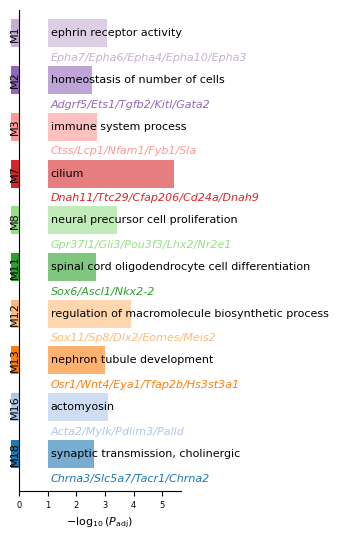

In [12]:
# Visualize top enriched GO terms for top 20 identified programs.
program_list = ggm.modules_summary['module_id'].tolist()
ggm.module_go_enrichment_plot(shown_modules = program_list[:20], go_per_module = 1)


In [13]:
# Mammalian Phenotype (MP) Ontology enrichment analysis with BH FDR control and p-value threshold 0.05.
ggm.mp_enrichment_analysis(species = 'mouse', padjust_method = "BH", pvalue_cutoff = 0.05)



Reading MP term information for |mouse|...

Start MP enrichment analysis ...
Found 0 significant enriched MP terms in M57        
MP enrichment analysis completed. Found 181 significant enriched MP terms total.


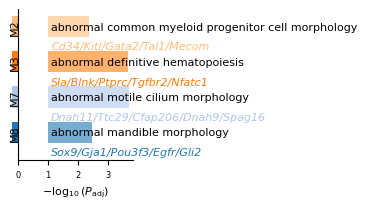

In [14]:
# Visualize top enriched MP terms for top 20 identified programs.
ggm.module_mp_enrichment_plot(shown_modules = program_list[:10], mp_per_module = 1)


In [15]:
# Print a summary of the GGM analysis.
print(ggm)


View of ggm object: Mouse Brain
MetaInfo:
  Gene Number: 1122
  Sample Number: 37068
  Pcor Threshold: 0.02

Results:
  SigEdges: DataFrame with 12967 significant gene pairs
  modules: 57 modules with 954 genes
  modules_summary: DataFrame with 57 rows
  FDR: Exists



In [16]:
# Save the GGM object to HDF5 for later reuse.
sg.save_ggm(ggm, "data/Mouse_Brain_MERFISH_T080.ggm.h5")


### Part 2: Spot annotation based on program expression ###

In [17]:
# Compute per-spot expression scores of each gene program.
sg.calculate_module_expression(adata, ggm)


Converting np.ndarray to csr_matrix...

Calculating module expression using top 30 genes...

Calculating gene weights based on degree...


/home/ypxu/Downloads/SpacGPA/SpacGPA/anno_cells.py:302: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['ggm_keys'] = {}


Storing module information in adata.uns['module_info']...

Assigning colors to 57 modules...

Total 57 modules' average expression calculated and stored in adata.obs and adata.obsm


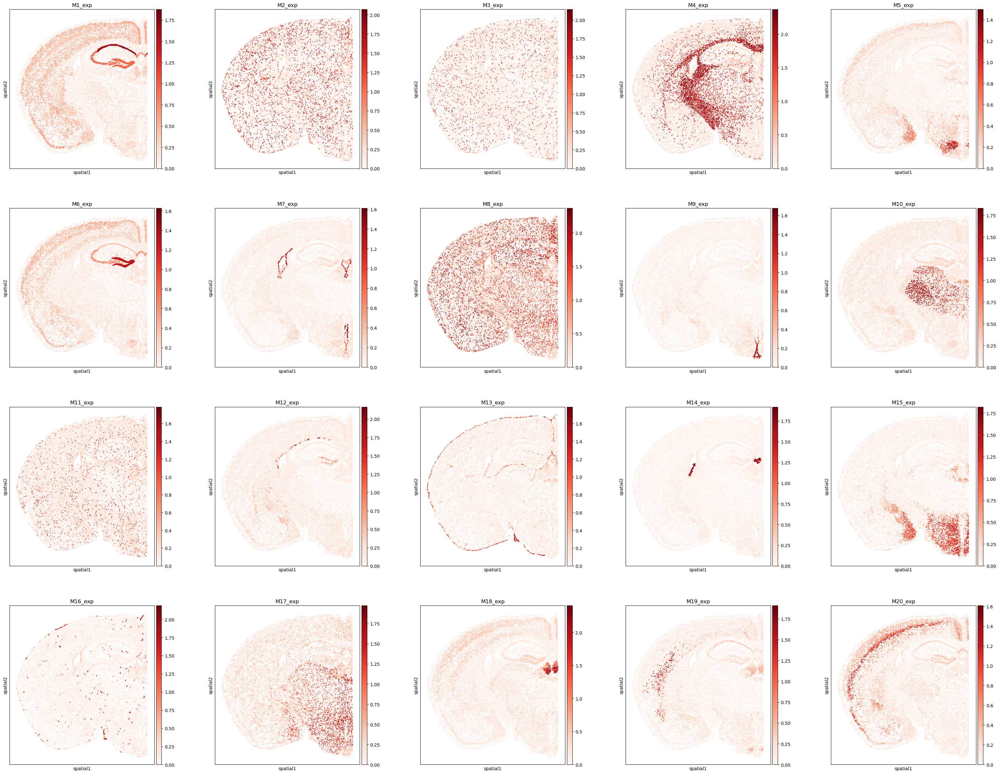

In [18]:
# Visualize the spatial distribution of the top 20 program-expression scores.
plt.rcParams["figure.figsize"] = (7, 7)
program_list = ggm.modules_summary['module_id'] + '_exp'
sc.pl.spatial(adata, spot_size = 0.03, color = program_list[:20], cmap = 'Reds', ncols = 5)


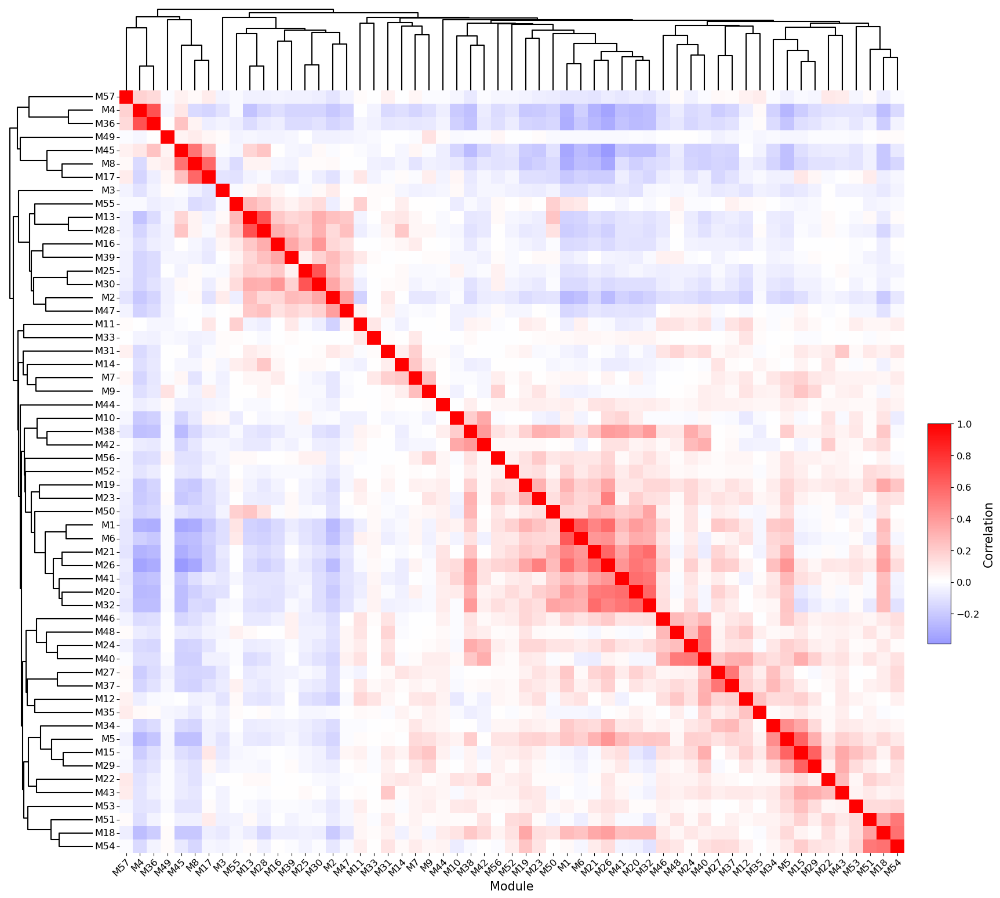

In [19]:
# Compute pairwise program similarity and plot the correlation heatmap with dendrograms.
sg.module_similarity_plot(adata, ggm_key = 'ggm', corr_method = 'pearson', heatmap_metric = 'correlation', 
                          fig_height = 19, fig_width = 20, dendrogram_height = 0.1, dendrogram_space = 0.06, return_summary = False)


In [20]:
# Assign spot-level annotations via Gaussian Mixture Models (GMMs) based on program expression.
sg.calculate_gmm_annotations(adata, ggm_key = 'ggm')


M1 processed successfully, annotated cells: 9635
M2 processed successfully, annotated cells: 5480
M3 processed successfully, annotated cells: 1923
M4 processed successfully, annotated cells: 6968
M5 processed successfully, annotated cells: 939
M6 processed successfully, annotated cells: 1044
M7 processed successfully, annotated cells: 772
M8 processed successfully, annotated cells: 5494
M9 processed successfully, annotated cells: 619
M10 processed successfully, annotated cells: 1757
M11 processed successfully, annotated cells: 1454
M12 processed successfully, annotated cells: 322
M13 processed successfully, annotated cells: 1001
M14 processed successfully, annotated cells: 470
M15 processed successfully, annotated cells: 4947
M16 processed successfully, annotated cells: 1619
M17 processed successfully, annotated cells: 2676
M18 processed successfully, annotated cells: 496
M19 processed successfully, annotated cells: 745
M20 processed successfully, annotated cells: 2138
M21 processed su

In [21]:
# Optionally smooth the annotations using spatial k-NN (on the 'spatial' embedding).
sg.smooth_annotations(adata, ggm_key = 'ggm', embedding_key = 'spatial', k_neighbors = 24)


M1 processed. remain cells: 12899
M2 processed. remain cells: 5717
M3 processed. remain cells: 1444
M4 processed. remain cells: 8109
M5 processed. remain cells: 1230
M6 processed. remain cells: 1192
M7 processed. remain cells: 874
M8 processed. remain cells: 5583
M9 processed. remain cells: 624
M10 processed. remain cells: 2476
M11 processed. remain cells: 1005
M12 processed. remain cells: 268
M13 processed. remain cells: 1048
M14 processed. remain cells: 477
M15 processed. remain cells: 6006
M16 processed. remain cells: 1423
M17 processed. remain cells: 2682
M18 processed. remain cells: 616
M19 processed. remain cells: 769
M20 processed. remain cells: 2589
M21 processed. remain cells: 2403
M22 processed. remain cells: 319
M23 processed. remain cells: 1860
M24 processed. remain cells: 651
M25 processed. remain cells: 1193
M26 processed. remain cells: 9052
M27 processed. remain cells: 1446
M28 processed. remain cells: 2682
M29 processed. remain cells: 1449
M30 processed. remain cells: 9

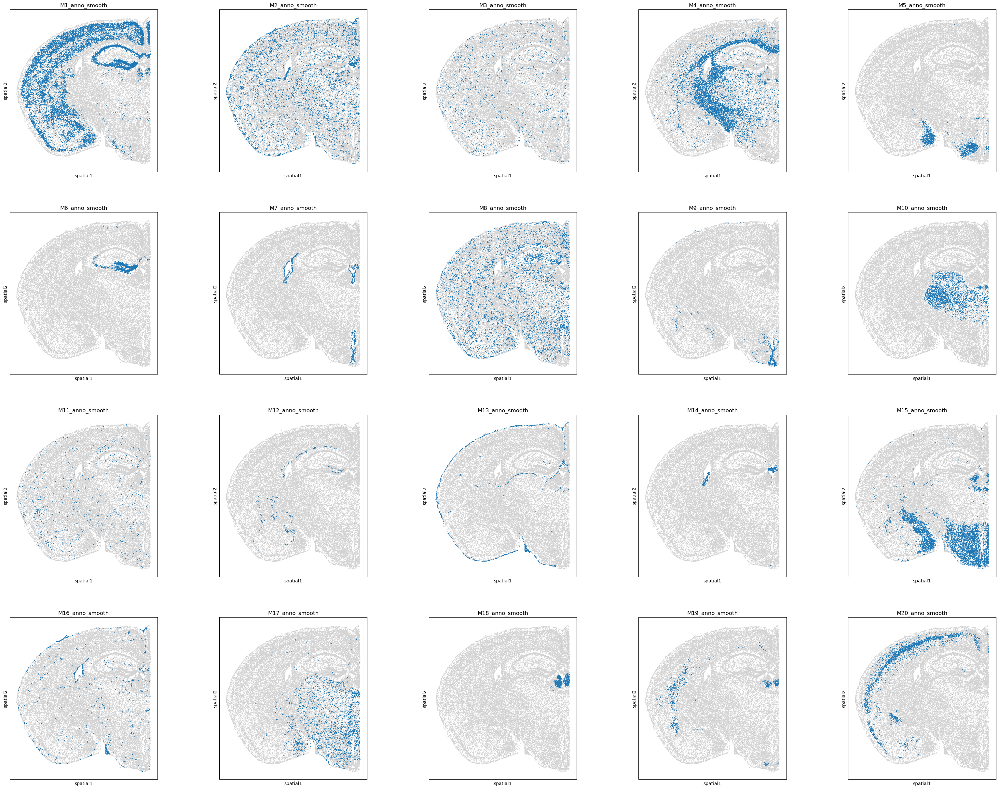

In [22]:
# Display smoothed annotations for top 20 programs.
# If smoothing is skipped, use 'M1_anno' … 'M20_anno' instead.
program_list = ggm.modules_summary['module_id'] + '_anno_smooth'
sc.pl.spatial(adata, spot_size = 0.03, color = program_list[:20], legend_loc = None, ncols = 5)
# Where the blue nodes indicate the spots annotated by the program, and gray nodes are unassigned.


In [23]:
# Integrate multiple program-derived annotations into a single label set via sg.integrate_annotations.
sg.integrate_annotations(adata, ggm_key = 'ggm', use_smooth = False, neighbor_similarity_ratio = 0.6, result_anno = 'ggm_annotation')
# Here we integrate all programs as an example. You can specify a subset of programs via the 'modules_used' parameter.



Calculating 24 nearest neighbors for each cell based on spatial embedding...


30143 of total 37068 cells have multiple annotations. Among them, 
    8002 cells are resolved by neighbors.
    22141 cells are resolved by expression score.

Integrated annotation stored in adata.obs['ggm_annotation'].



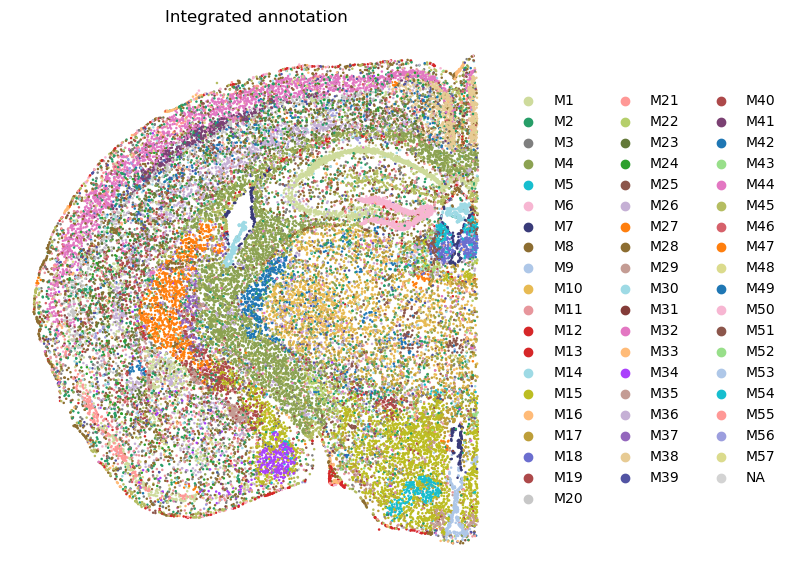

In [24]:
# Visualize the integrated annotation.
plt.rcParams["figure.figsize"] = (7, 7)
sc.pl.spatial(adata, spot_size = 0.03, color = ['ggm_annotation'], palette = adata.uns['module_colors'], frameon = False, title = 'Integrated annotation')


In [25]:
# Save the annotated AnnData object.
adata.write("data/Mouse_Brain_MERFISH_T080_ggm_anno.h5ad")
